In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

### TASK 1

In [2]:
import numpy as np

#OR gate truth table
X = np.array([[0, 0], [0, 1], [1, 0], [1, 1]]) 
Y = np.array([0, 1, 1, 1])

#unit step function

def activation_function(x):
    if x >= 0:
        return 1
    else:
        return 0

#perceptron learning scheme

def perceptron_learning(X, Y, learning_rate, num_epochs):
    w = np.zeros(X.shape[1])
    b = 0
    for epoch in range(num_epochs):
        for i in range(X.shape[0]):
            # Calculate the predicted output
            y_hat = activation_function(np.dot(w, X[i]) + b)
            # Update the weights and bias based on the error
            w += learning_rate * (Y[i] - y_hat) * X[i]
            b += learning_rate * (Y[i] - y_hat)
    return w, b


## OR

# Train the perceptron on the OR gate truth table
w, b = perceptron_learning(X, Y, learning_rate=0.1, num_epochs=100)

# Test the trained perceptron on some inputs
print(activation_function(np.dot(w, [0, 0]) + b)) # 0
print(activation_function(np.dot(w, [0, 1]) + b)) # 1
print(activation_function(np.dot(w, [1, 0]) + b)) # 1
print(activation_function(np.dot(w, [1, 1]) + b)) # 1

## AND

X2 = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])
Y2 = np.array([0, 0, 0, 1])

w, b = perceptron_learning(X2, Y2, learning_rate=0.1, num_epochs=100)

print(activation_function(np.dot(w, [0, 1]) + b)) # 0
print(activation_function(np.dot(w, [0, 0]) + b)) # 0
print(activation_function(np.dot(w, [1, 0]) + b)) # 0
print(activation_function(np.dot(w, [1, 1]) + b)) # 1

0
1
1
1
0
0
0
1


In [3]:
file = pd.read_csv('horseRacing.csv')
file.head()

,race_id,horse_id,1-101,1-102,1-103,1-104,1-105,1-106,1-107,1-108,...,3-132,4-105,4-109,4-110,4-114,4-115,4-116,4-117,calc_position,price
0,495886,565129,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.71,...,-1.16,0.0,1.87,1.87,-2.07,-1.96,-1.95,-0.30,8.0,17.0
1,495886,607093,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.05,...,0.77,0.0,0.00,0.00,0.00,0.00,0.00,0.07,5.0,26.0
2,495886,637337,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.97,...,-1.16,0.0,0.00,0.00,0.48,0.44,0.39,-0.86,7.0,17.0
3,495886,659819,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.21,...,0.77,0.0,0.00,0.00,0.32,1.09,0.78,-0.86,1.0,4.0
4,495886,661530,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.08,...,0.77,0.0,0.00,0.00,0.00,0.00,0.39,1.17,4.0,7.0


In [4]:
file.isnull().sum()

race_id              0
horse_id             0
1-101            64722
1-102            64602
1-103            64641
                 ...  
4-115            10352
4-116            11402
4-117             9470
calc_position        4
price                0
Length: 64, dtype: int64

In [5]:
fig = px.bar(file.isnull().sum(), x=file.isnull().sum().index, y=file.isnull().sum().values, color=file.isnull().sum().values, color_continuous_scale='Viridis')
fig.show()

Data preprocessing

In [6]:
file = file.dropna(thresh=0.5*len(file.columns), axis=0) # drop rows with more than 50% missing values
file.isnull().sum()

race_id              0
horse_id             0
1-101            43628
1-102            43508
1-103            43547
                 ...  
4-115              587
4-116             1082
4-117              545
calc_position        4
price                0
Length: 64, dtype: int64

In [7]:
#now we will replace the missing values with the mean of the column
file = file.fillna(file.mean())
file.isnull().sum()

race_id          0
horse_id         0
1-101            0
1-102            0
1-103            0
                ..
4-115            0
4-116            0
4-117            0
calc_position    0
price            0
Length: 64, dtype: int64

In [8]:
file.head()

,race_id,horse_id,1-101,1-102,1-103,1-104,1-105,1-106,1-107,1-108,...,3-132,4-105,4-109,4-110,4-114,4-115,4-116,4-117,calc_position,price
0,495886,565129,-0.035821,-0.038581,-0.04079,-0.046163,-0.062251,-0.048463,-0.059002,-0.71,...,-1.16,0.0,1.87,1.87,-2.07,-1.96,-1.95,-0.30,8.0,17.0
1,495886,607093,-0.035821,-0.038581,-0.04079,-0.046163,-0.062251,-0.048463,-0.059002,-0.05,...,0.77,0.0,0.00,0.00,0.00,0.00,0.00,0.07,5.0,26.0
2,495886,637337,-0.035821,-0.038581,-0.04079,-0.046163,-0.062251,-0.048463,-0.059002,-0.97,...,-1.16,0.0,0.00,0.00,0.48,0.44,0.39,-0.86,7.0,17.0
3,495886,659819,-0.035821,-0.038581,-0.04079,-0.046163,-0.062251,-0.048463,-0.059002,0.21,...,0.77,0.0,0.00,0.00,0.32,1.09,0.78,-0.86,1.0,4.0
4,495886,661530,-0.035821,-0.038581,-0.04079,-0.046163,-0.062251,-0.048463,-0.059002,0.08,...,0.77,0.0,0.00,0.00,0.00,0.00,0.39,1.17,4.0,7.0


In [9]:
#now we will take second last column and convert the label into 0 and 1
# the column which is 1, it stays 1 
# the columns other than 1, it becomes 0
file['calc_position'] = file['calc_position'].apply(lambda x: 1 if x == 1 else 0)
file.head()

,race_id,horse_id,1-101,1-102,1-103,1-104,1-105,1-106,1-107,1-108,...,3-132,4-105,4-109,4-110,4-114,4-115,4-116,4-117,calc_position,price
0,495886,565129,-0.035821,-0.038581,-0.04079,-0.046163,-0.062251,-0.048463,-0.059002,-0.71,...,-1.16,0.0,1.87,1.87,-2.07,-1.96,-1.95,-0.30,0,17.0
1,495886,607093,-0.035821,-0.038581,-0.04079,-0.046163,-0.062251,-0.048463,-0.059002,-0.05,...,0.77,0.0,0.00,0.00,0.00,0.00,0.00,0.07,0,26.0
2,495886,637337,-0.035821,-0.038581,-0.04079,-0.046163,-0.062251,-0.048463,-0.059002,-0.97,...,-1.16,0.0,0.00,0.00,0.48,0.44,0.39,-0.86,0,17.0
3,495886,659819,-0.035821,-0.038581,-0.04079,-0.046163,-0.062251,-0.048463,-0.059002,0.21,...,0.77,0.0,0.00,0.00,0.32,1.09,0.78,-0.86,1,4.0
4,495886,661530,-0.035821,-0.038581,-0.04079,-0.046163,-0.062251,-0.048463,-0.059002,0.08,...,0.77,0.0,0.00,0.00,0.00,0.00,0.39,1.17,0,7.0


In [10]:
#now normalize the dataset so that we dont have any negative values left in the dataset
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
file = pd.DataFrame(scaler.fit_transform(file), columns=file.columns)
file.head()

,race_id,horse_id,1-101,1-102,1-103,1-104,1-105,1-106,1-107,1-108,...,3-132,4-105,4-109,4-110,4-114,4-115,4-116,4-117,calc_position,price
0,0.0,0.249160,0.372275,0.331639,0.385393,0.362224,0.330875,0.346752,0.325693,0.404834,...,0.181818,0.30703,0.753604,0.712271,0.181311,0.186992,0.148688,0.315315,0.0,0.035343
1,0.0,0.267877,0.372275,0.331639,0.385393,0.362224,0.330875,0.346752,0.325693,0.504532,...,0.464809,0.30703,0.508519,0.448519,0.470014,0.452575,0.432945,0.370871,0.0,0.054054
2,0.0,0.281366,0.372275,0.331639,0.385393,0.362224,0.330875,0.346752,0.325693,0.365559,...,0.181818,0.30703,0.508519,0.448519,0.536960,0.512195,0.489796,0.231231,0.0,0.035343
3,0.0,0.291394,0.372275,0.331639,0.385393,0.362224,0.330875,0.346752,0.325693,0.543807,...,0.464809,0.30703,0.508519,0.448519,0.514644,0.600271,0.546647,0.231231,1.0,0.008316
4,0.0,0.292157,0.372275,0.331639,0.385393,0.362224,0.330875,0.346752,0.325693,0.524169,...,0.464809,0.30703,0.508519,0.448519,0.470014,0.452575,0.489796,0.536036,0.0,0.014553


In [11]:
#make a new csv file named cleaned_horseRacing.csv
file.to_csv('cleaned_horseRacing.csv', index=False)

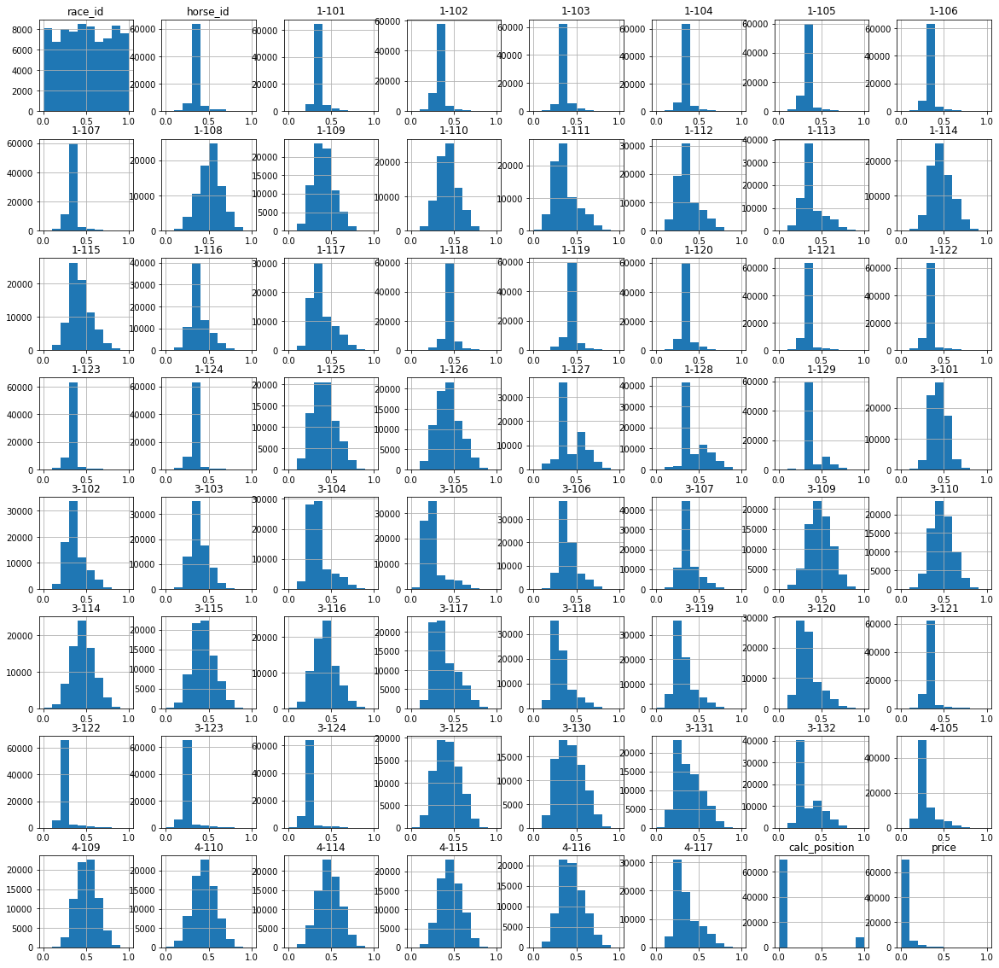

In [12]:
#make a histogram of the dataset
file.hist(figsize=(20,20))
plt.show()

In [13]:
#make an interactive line plot
fig = px.scatter(file, x=file['race_id'], y=file['horse_id'], color=file['calc_position'])#color_continuous_scale='Viridis',)
fig.show()

In [14]:
#make an interactive plot to visualize the data
fig = px.scatter_3d(file, x='calc_position', y='horse_id', z='race_id', color='calc_position')
fig.show()

In [15]:
fig = px.imshow(file.corr())
fig.update_layout(width=1000, height=1000)
fig.show()

In [16]:
#now apply MLP classifier
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
X = file.drop('calc_position', axis=1)
y = file['calc_position']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
mlp = MLPClassifier(hidden_layer_sizes=(100, 100, 100), max_iter=1000)
mlp.fit(X_train, y_train)
predictions = mlp.predict(X_test)
